In [1]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
from mmseg.apis.inference import LoadImage
from mmseg.core.evaluation import get_palette
from mmseg.datasets.pipelines import Compose
from mmseg.ops import resize

import mmcv
from mmcv.parallel import collate, scatter
from torchvision import io
import torch
import torch.nn.functional as F
from torchvision import transforms as T

/home/cariad/.local/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


/usr/local/lib/python3.8/dist-packages/torchvision-0.14.0a0+a67cc87-py3.8-linux-x86_64.egg/torchvision/image.so


In [2]:
import sys, os
sys.path.insert(0, './road-anomaly-benchmark')

os.environ['DIR_OUTPUTS'] = 'outputs'
os.environ['DIR_DATASETS'] = 'datasets'

from road_anomaly_benchmark.evaluation import Evaluation

In [3]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 

In [4]:
from pylab import rcParams
rcParams['figure.figsize'] = 15, 5

# Fetch model config and weights and initialize SegFormer NN

In [5]:
# https://github.com/open-mmlab/mmsegmentation/tree/master/configs/segformer

!wget -nc https://raw.githubusercontent.com/open-mmlab/mmsegmentation/master/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py
!wget -nc https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

File ‘segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py’ already there; not retrieving.

File ‘segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ already there; not retrieving.



In [6]:
config = mmcv.Config.fromfile('mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py')
checkpoint_file = './segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'
model = init_segmentor(config, checkpoint_file, device='cuda:0')

/home/cariad/packages/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:235: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(


load checkpoint from local path: ./segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth


In [7]:
ROAD_CLASS = 0 # Cityscapes

In [8]:
def load_image(frame):
    """ convert road segmentation frame to mmcv image with metadata """
    return {
        'fid': frame['fid'],
        'filename': frame['fid'],
        'ori_filename': frame['fid'],
        'dset_name': frame['dset_name'],
        'img': frame['image'],
        'img_shape': frame['image'].shape,
        'ori_shape': frame['image'].shape
    }
    
pipeline = Compose([load_image] + config.data.test.pipeline[1:])

In [9]:
def scale(t):
    return (t - t.min()) / (t.max()-t.min())

# Load training data class statistics

In [10]:
class_mean = np.load(f'stats/cityscape_1000_mean.npy', allow_pickle=True).item()
class_var = np.load(f'stats/cityscape_1000_var.npy', allow_pickle=True).item()


In [11]:
experiment = 'ObsFormer'

## Use road anomaly becnkmark Evalution class to load validataion dataset and calculate metrics

In [12]:
ev = Evaluation(
    method_name = experiment,
    dataset_name ='ObstacleTrack-validation'
    # dataset_name = 'ObstacleTrack-test',
)

# Run anolmaly detection on images

Exclude 30 -> 30


'validation_1'

0.36356690872547237 0.7854650587754424


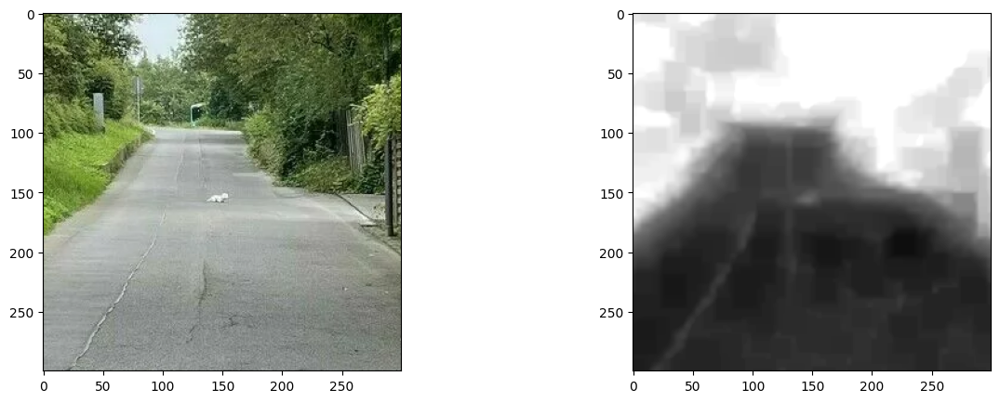

'validation_10'

0.3446580525041724 0.8107085474389404


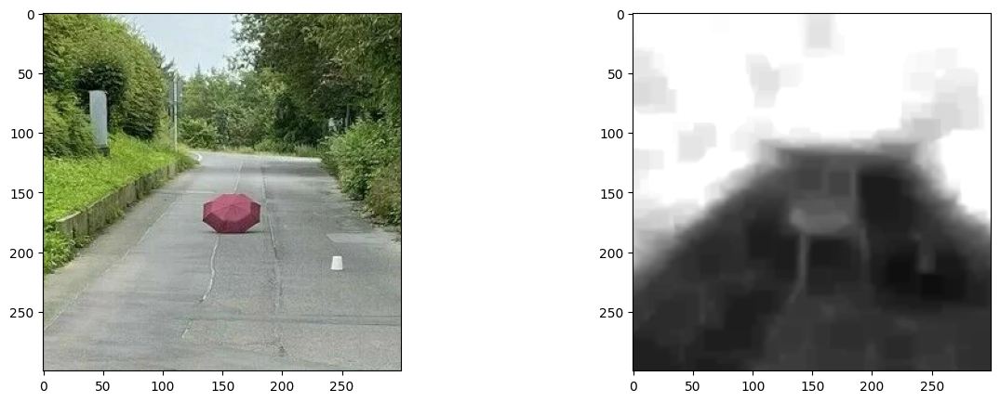

'validation_11'

0.6460646449127522 0.7412145795010477


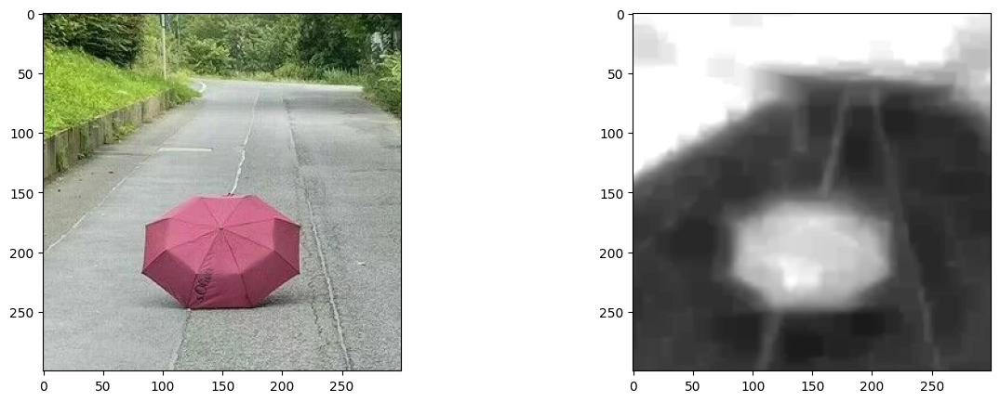

'validation_12'

0.4243866401874364 0.8171702881014661


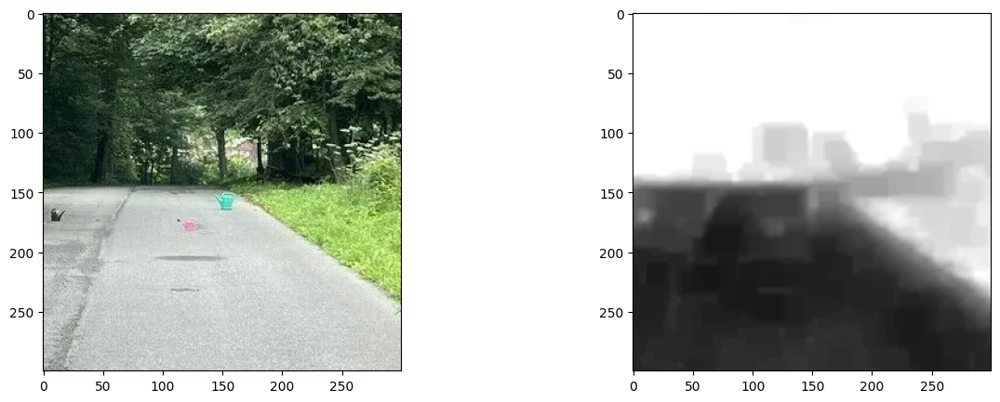

'validation_13'

0.4251050611670013 0.7950836752802457


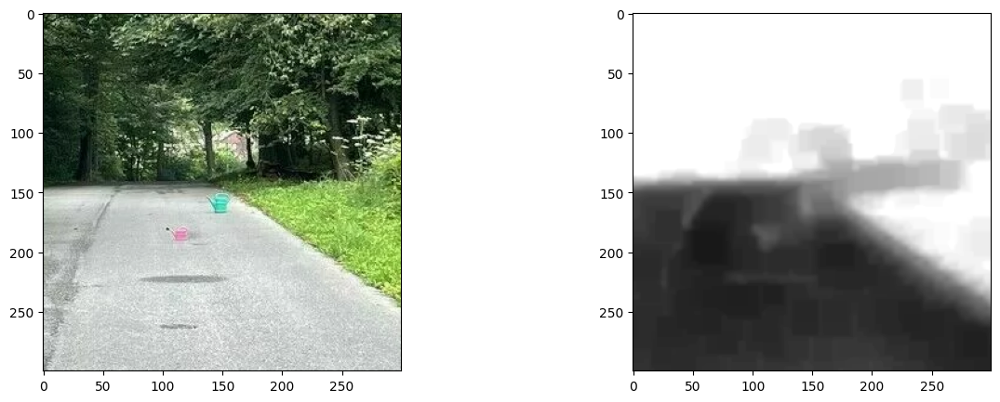

'validation_14'

0.557491453612695 0.7443651278146083


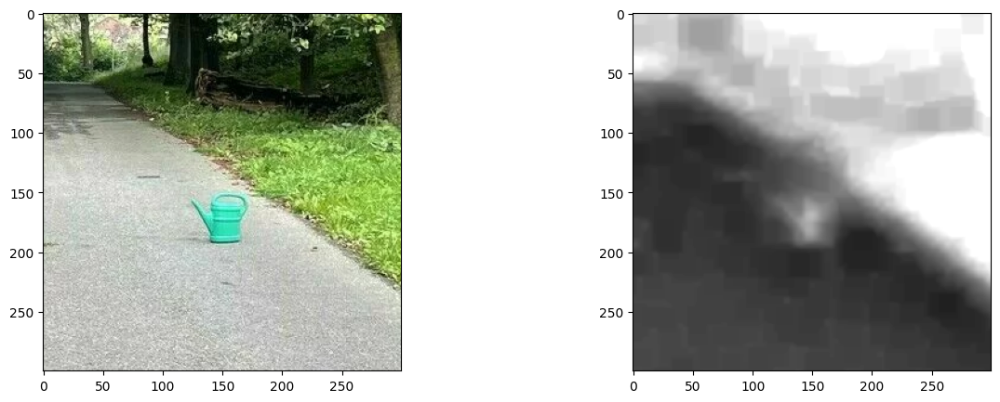

'validation_15'

0.3819346957736545 0.7810777651037569


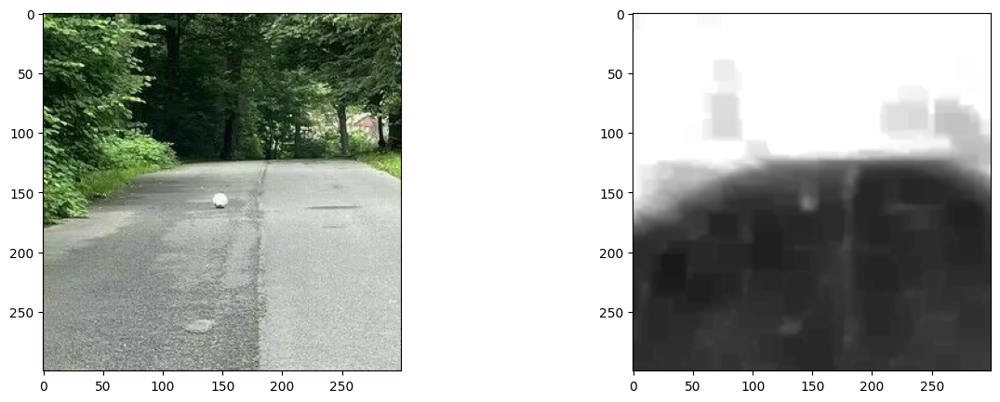

'validation_16'

0.41253771100725445 0.7955841402254786


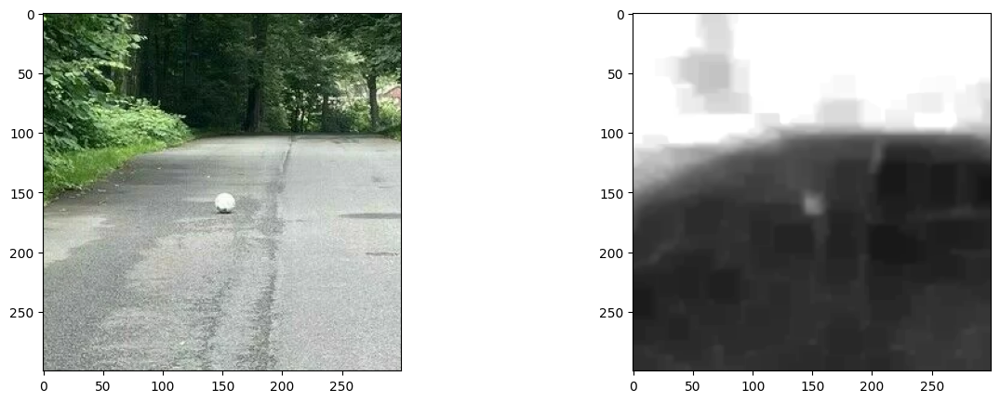

'validation_17'

0.377926403685998 0.7617401731382261


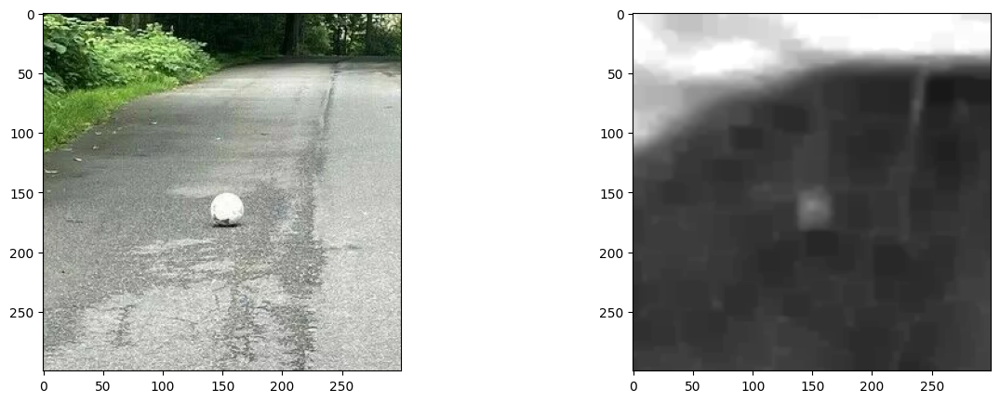

'validation_18'

0.6142269134521484 0.7721597827647275


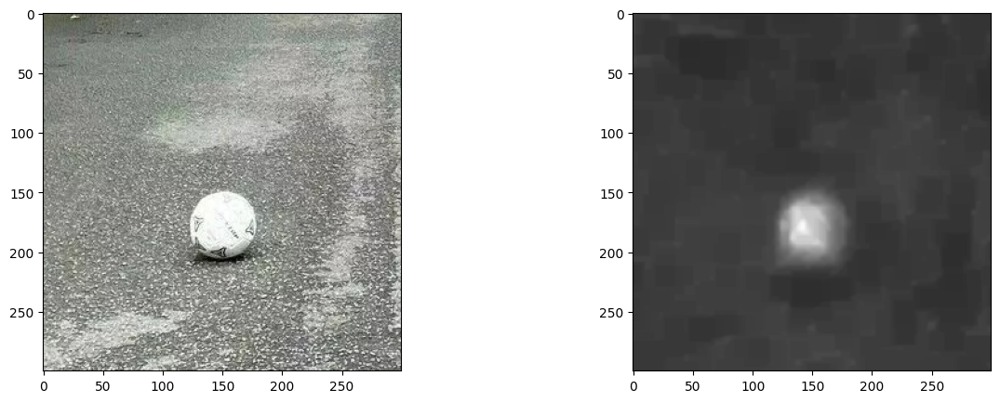

'validation_2'

0.42057406483891085 0.7815362814186606


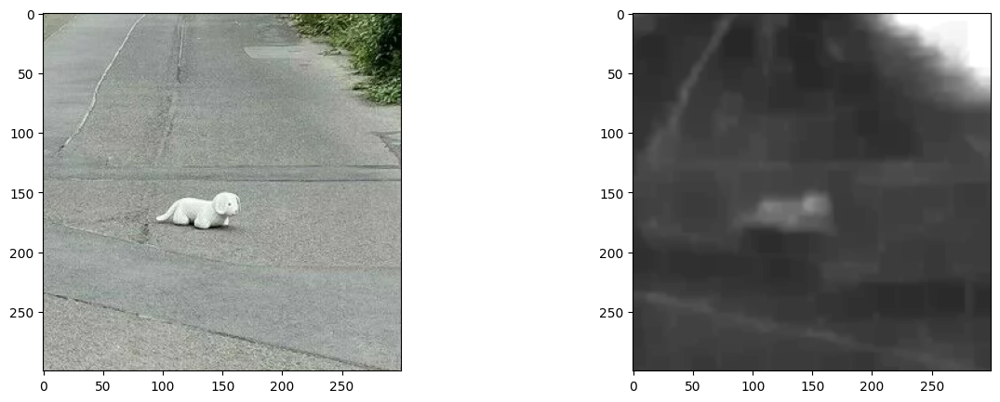

'validation_20'

0.2618418974034927 0.7651504679461514


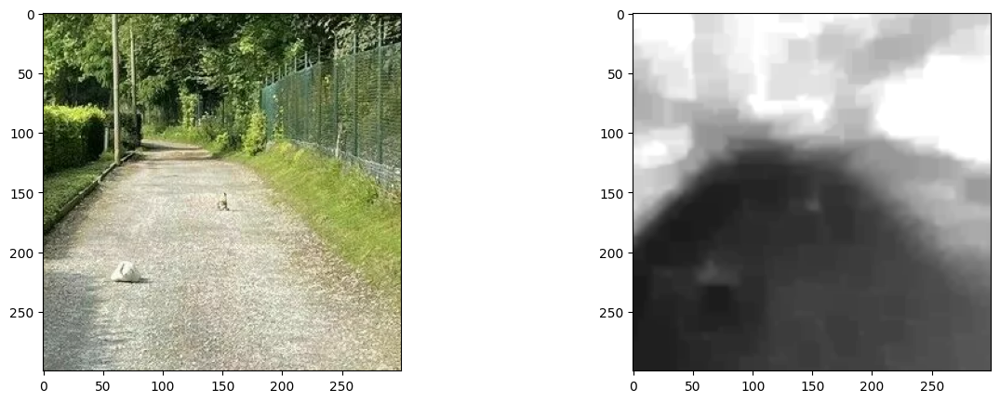

'validation_3'

0.5876995532154686 0.7633109244389698


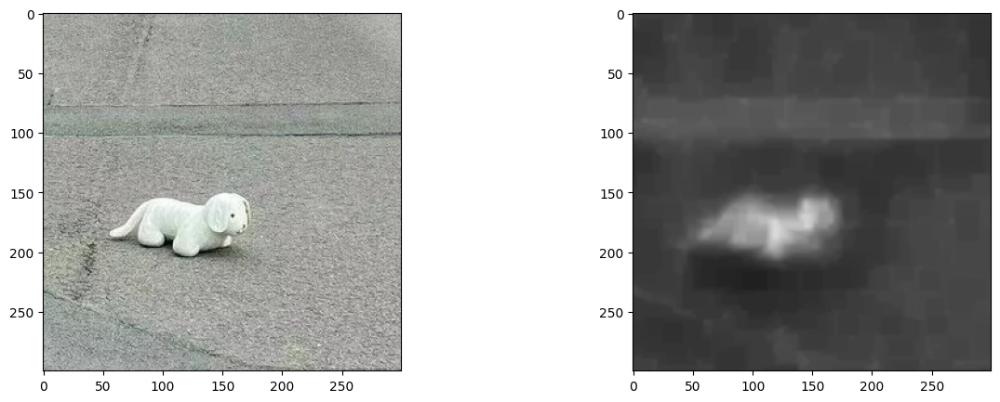

'validation_30'

0.4671780621563947 0.7708273738126991


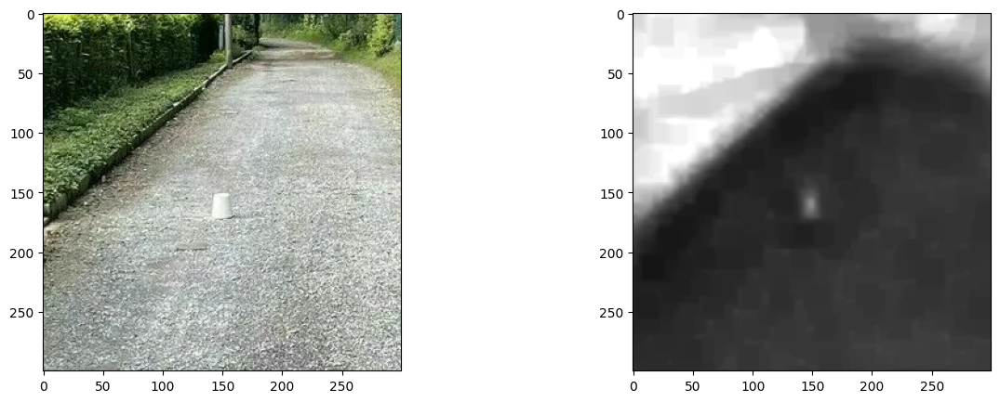

'validation_31'

0.5202360802988576 0.7368296472212923


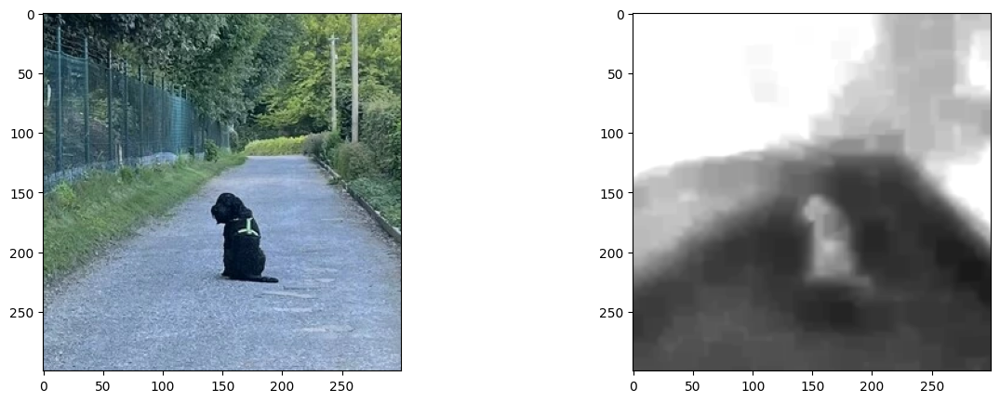

'validation_32'

0.6068088523905939 0.7369017690210231


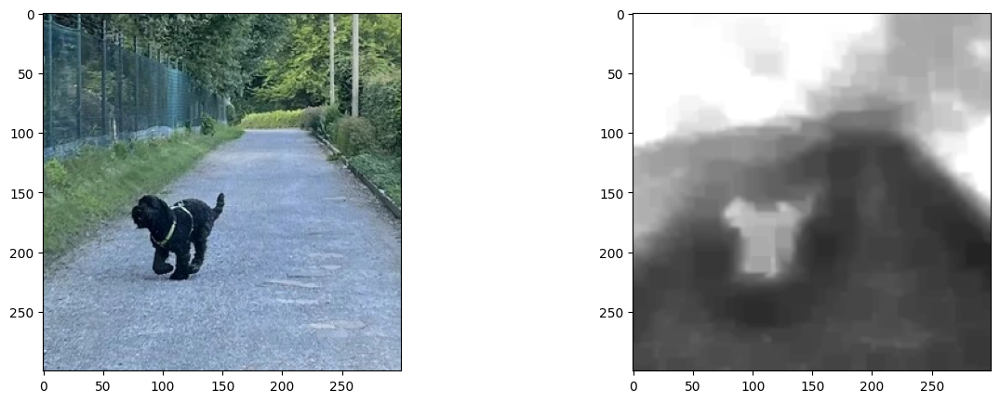

'validation_33'

0.6018945953691479 0.7238077682588193


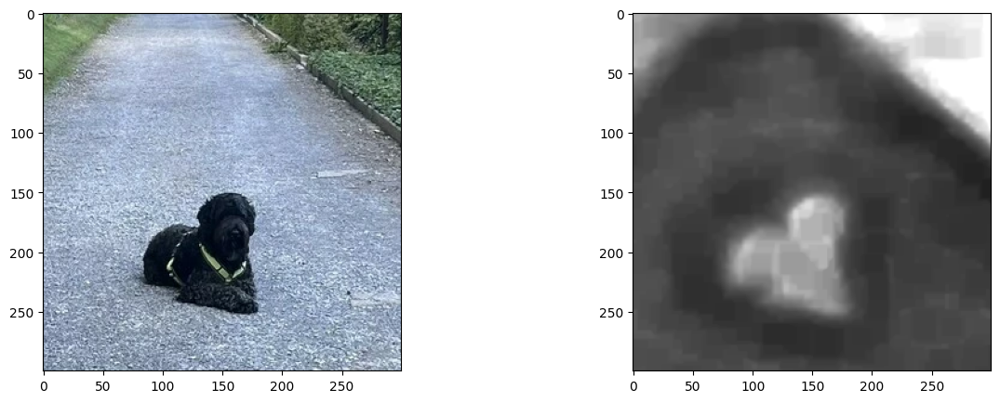

'validation_34'

0.744688156464426 0.6905031039646424


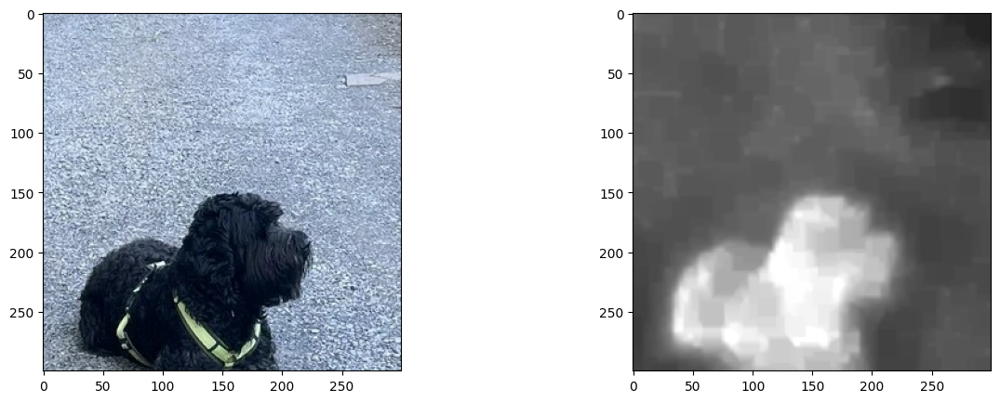

'validation_35'

0.603436557390062 0.7286523297191272


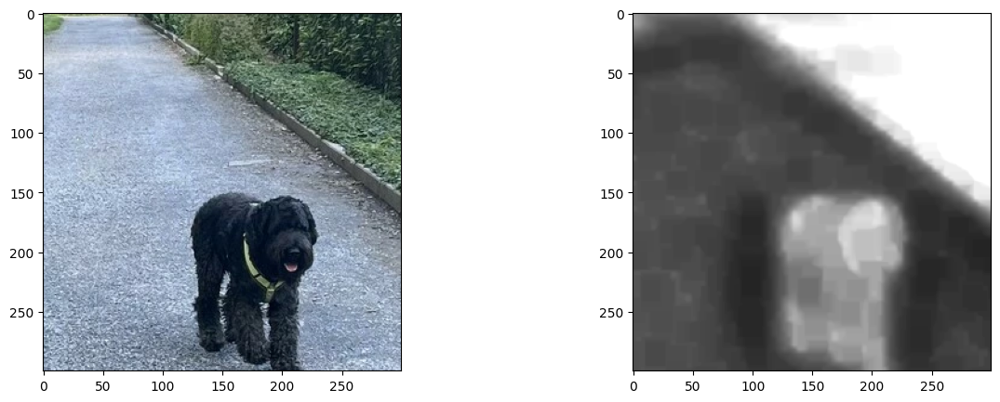

'validation_36'

0.4626324029256589 0.7936431060571324


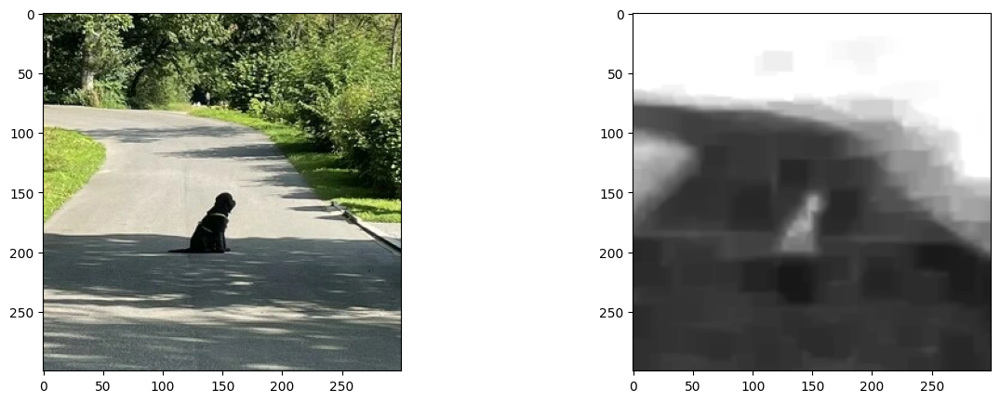

'validation_37'

0.5215093592607862 0.7688772313918781


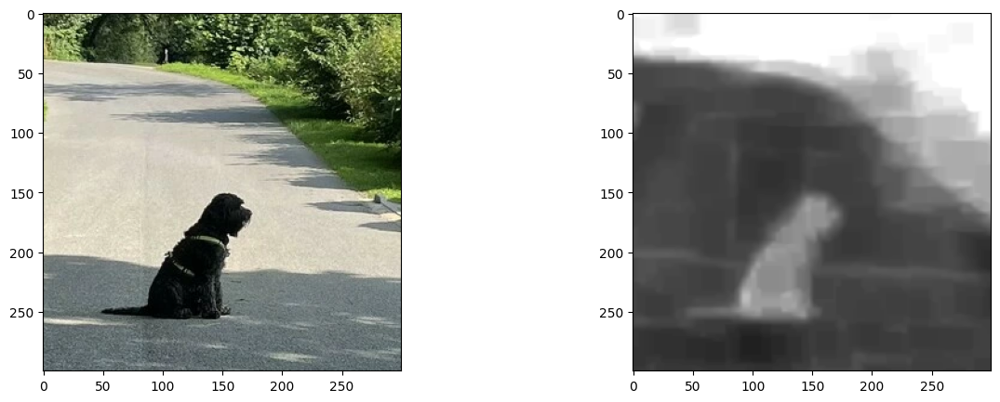

'validation_38'

0.556186724735498 0.7381221171837604


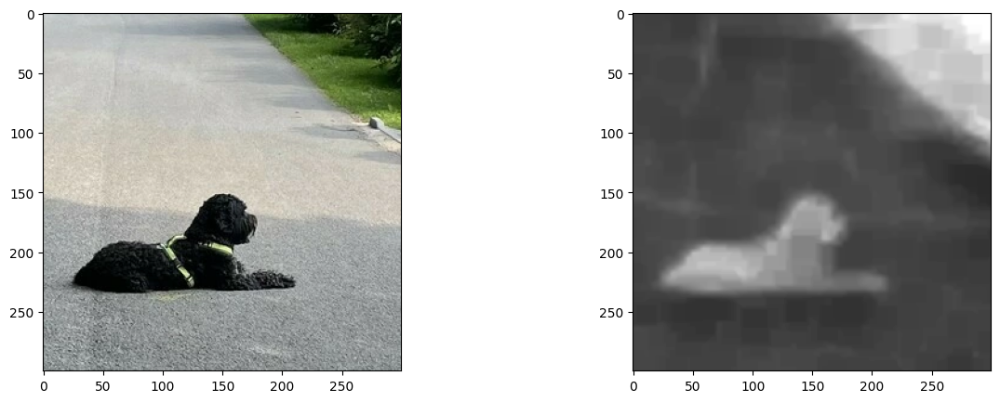

'validation_39'

0.5875733303249098 0.7432602294626197


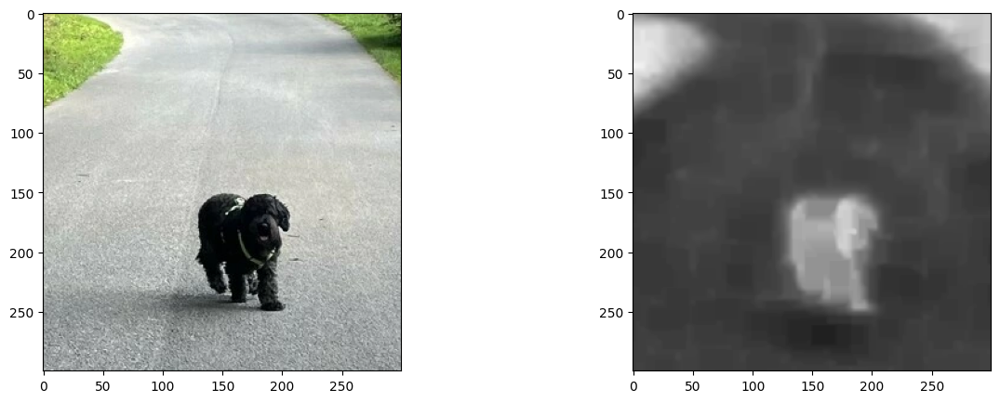

'validation_4'

0.3564506850930783 0.7726157442626909


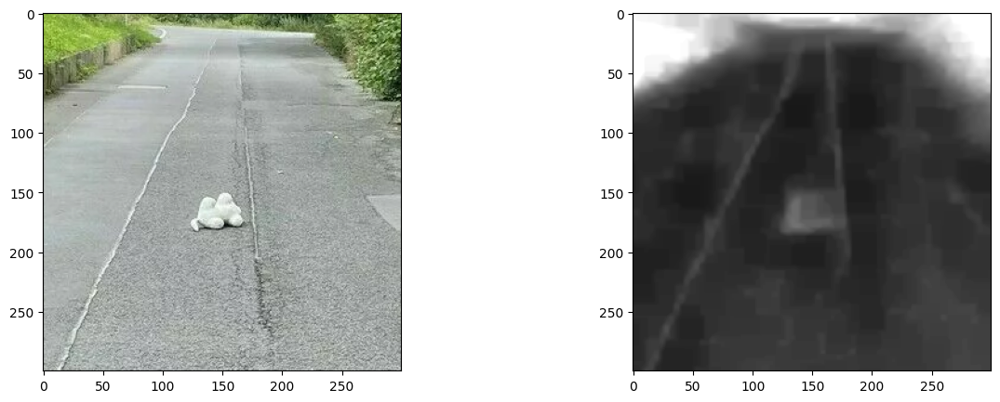

'validation_40'

0.576256133607985 0.7596051953772951


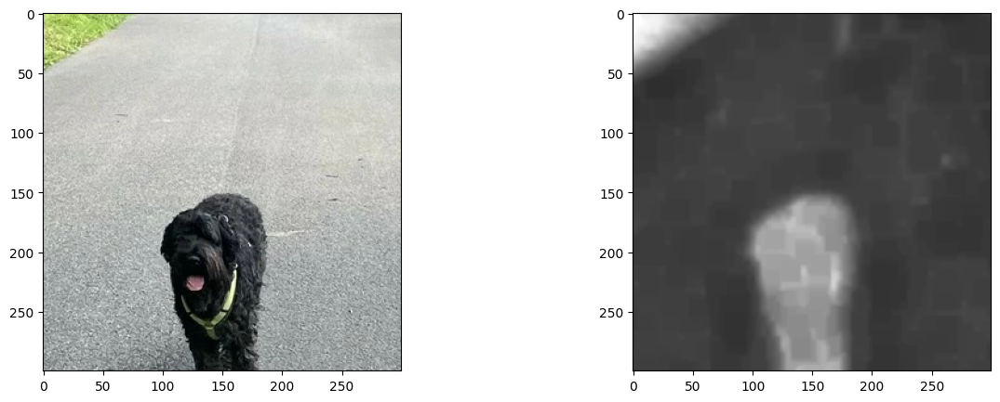

'validation_5'

0.5787326529990247 0.7919027494552546


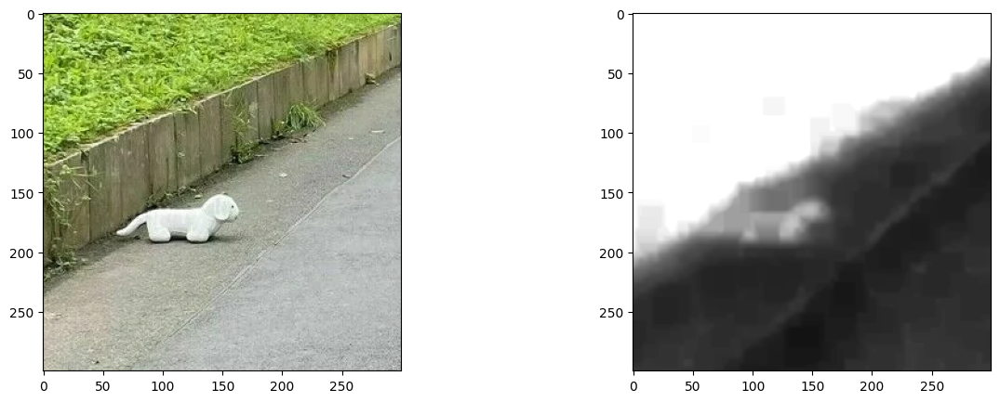

'validation_6'

0.39866525618756404 0.7824156690458792


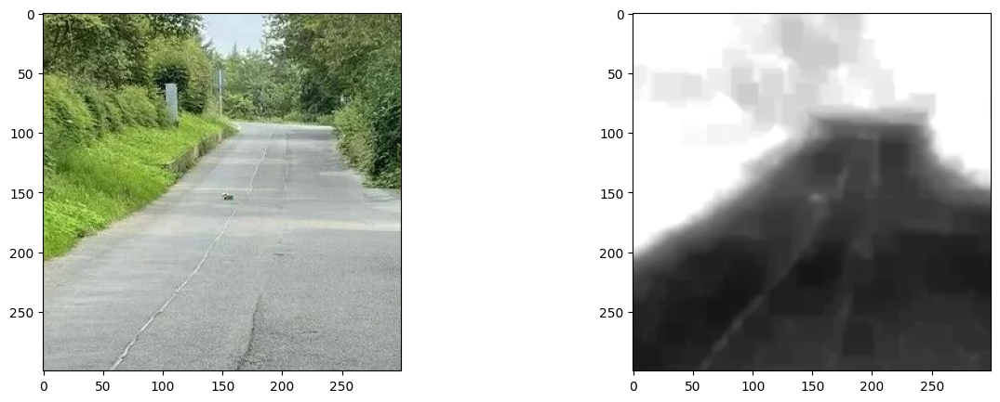

'validation_7'

0.4611800370740969 0.7583212833914054


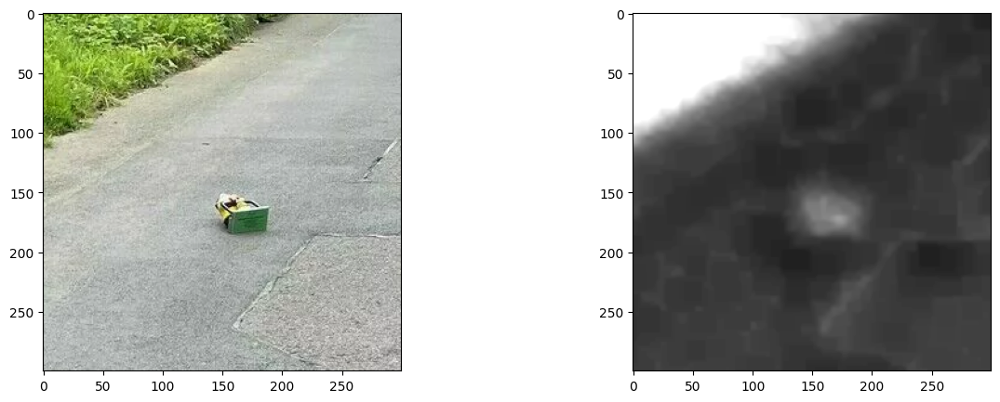

'validation_8'

0.5189720986997289 0.8006706213828919


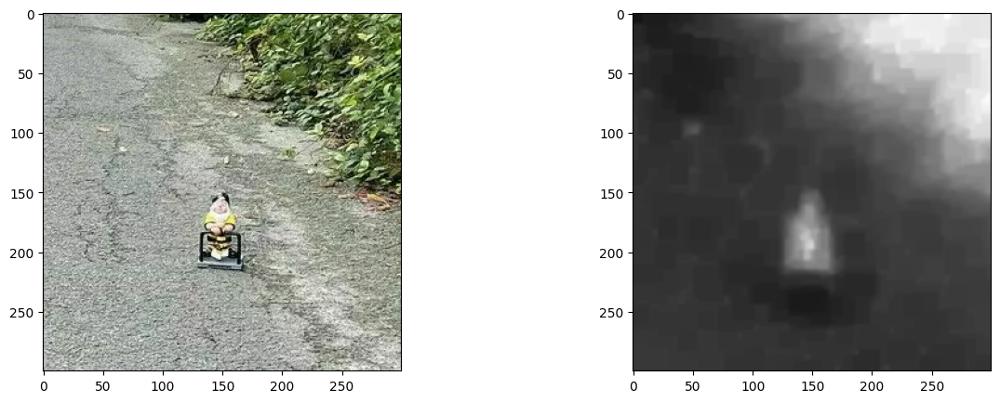

'validation_9'

0.4338019216597976 0.751764449109315


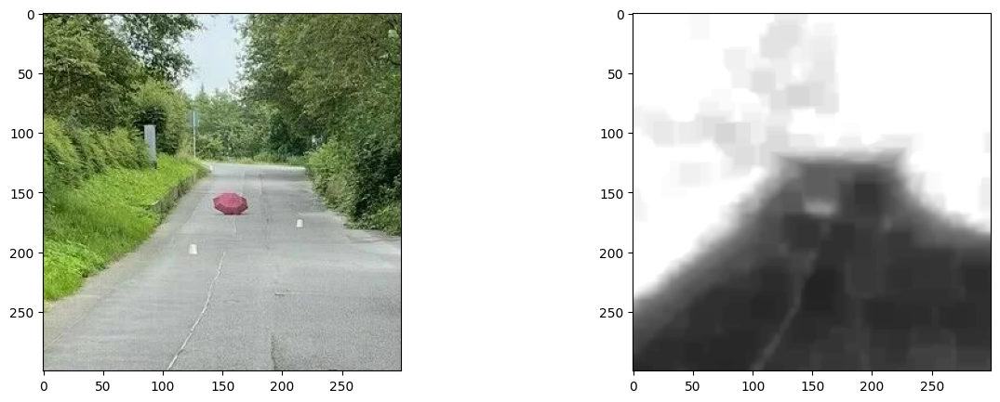

In [13]:
from sklearn.mixture import GaussianMixture

kernel1 = np.ones((3, 3), np.uint8)
kernel2 = np.ones((15, 15), np.uint8)

with torch.no_grad():
    for frame in ev.get_frames():
        display(frame.fid)
        label_mask = cv.imread(f'./datasets/dataset_ObstacleTrack/labels_masks/{frame.fid}_labels_semantic.png')[:,:,0]
        
        data = pipeline(frame)
        img = data['img'][0]
        
        x = model.extract_feat(img[None,:].cuda())
        out = model._decode_head_forward_test(x, [])
        
        out = resize(
            input=out,
            size=frame.image.shape[:2],
            mode='bilinear',
            align_corners=False)
        
        out = out.cpu() # logits
        
        # standardize by road class mean and var
        road_norm = T.Normalize(class_mean[ROAD_CLASS], class_var[ROAD_CLASS])(out)
        
        gm = GaussianMixture(n_components = 2, random_state = 1, n_init = 3).fit(road_norm[0, ROAD_CLASS, ::4, ::4].cpu().reshape(-1, 1))
        road_mean = np.max(gm.means_)
        background_mean = np.min(gm.means_)

        background_var = gm.covariances_[np.argmin(gm.means_)][0][0]
        road_var = gm.covariances_[np.argmax(gm.means_)][0][0]

        
        # approach 1
        step1 = (road_norm[0, ROAD_CLASS] - background_mean) # 0 = obstacle, 1 = road
        step2 = step1.clip(road_mean, np.abs(background_mean) + 2*np.sqrt(background_var))
        
        anomaly_p = scale(-step2) # 1=obstacle, 0 = road
        
        
        # Score smoothing
        anomaly_p = cv.morphologyEx(anomaly_p.numpy(), cv.MORPH_OPEN, kernel1) 
        anomaly_p = cv.morphologyEx(anomaly_p, cv.MORPH_CLOSE, kernel2) 

        
        #######
         
            
        mask_roi = (label_mask < 255) # exclude ignore area
        labels_in_roi = label_mask[mask_roi]
        predictions_in_roi = anomaly_p[mask_roi]

        gt_label_bool = labels_in_roi.astype(bool)

        area = labels_in_roi.__len__()
        gt_area_true = np.count_nonzero(gt_label_bool)
        
        gt_area_false = area - gt_area_true

        prob_at_true = predictions_in_roi[gt_label_bool].sum() / gt_area_true
        prob_at_false = 1 - predictions_in_roi[~gt_label_bool].sum() / (area - gt_area_true)

        
        print(prob_at_true, prob_at_false)
        
        
        obs = np.where(label_mask == 1)
        zoom_area = slice(obs[0][0]-150, obs[0][0]+150), slice(obs[1][0]-150, obs[1][0]+150)
               

        fig, axs = plt.subplots(1, 2)
        axs[0].imshow(frame.image[zoom_area[0],zoom_area[1]], vmin=0, vmax=1)
        axs[1].imshow(anomaly_p[zoom_area[0],zoom_area[1]], cmap='gray', vmin=0, vmax=1)
        plt.show()          
         
        ev.save_output(frame, anomaly_p)
        #break
ev.wait_to_finish_saving()

# Calculate and display metrics

In [14]:
ev.calculate_metric_from_saved_outputs('PixBinaryClass')
ev.calculate_metric_from_saved_outputs('SegEval-ObstacleTrack',sample=None, frame_vis=False, default_instancer=True)

100%|██████████| 30/30 [00:00<00:00, 50.10it/s]


ap-sum 0.8956564450438073 ap-trapz 0.8956331627390994


100%|██████████| 30/30 [00:01<00:00, 23.91it/s]

Mean sIoU GT   : 0.3751164130361338
Mean sIoU PRED : 0.3331401407225563
Mean Precision PRED : 0.5139653874951269
---sIoU thresh averaged
Number of TPs  : 19.09090909090909
Number of FNs  : 25.90909090909091
Number of FPs  : 24.0
F1 score       : 0.4293968984058872


ResultsInfo(method_name='ObsFormer', dataset_name='ObstacleTrack-validation', tp_25=25, tp_50=19, tp_75=11, tp_mean=19.09090909090909, fp_25=24, fp_50=24, fp_75=24, fp_mean=24.0, fn_25=20, fn_50=26, fn_75=34, fn_mean=25.90909090909091, f1_25=0.5319148936170213, f1_50=0.4318181818181818, f1_75=0.275, f1_mean=0.4293968984058872, sIoU_gt=0.3751164130361338, sIoU_pred=0.3331401407225563, prec_pred=0.5139653874951269)

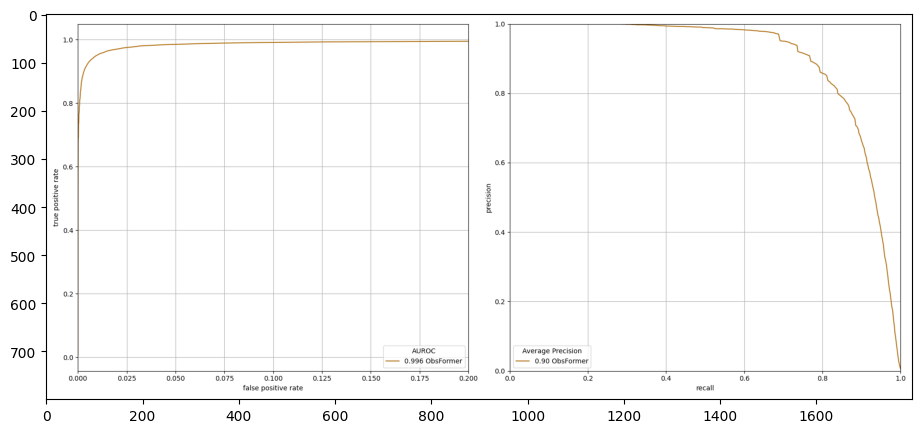

In [15]:
plt.imshow(cv.imread(f'./outputs/PixBinaryClass/plot/{ev.method_name}_ObstacleTrack-validation__PixClassCurves.png'))